In [ ]:
"""
Created By    : Jared W. Marquis
Creation Date : 01 August 2022
Course        : ATSC 528 - Atmospheric Data Analysis
Assignment    : #02 - Successive Corrections

Edited By     : Josh Nielsen
Edited On     : 03 August 2022

Purpose:
Script to take sparse upper air observations and analyze them on a
polar stereographic map projection using successive corrections.
Script reads in observations from a text file, creates a map with grid
points to be used for analysis, performs Cressman weighted and successive
corrections analyses, plots the analyses on polar stereographic map
projections, and saves the values to a file. 

"""
__author__    = "Jared W. Marquis"
__contact__   = "jared.marquis@und.edu"

__editor__    = "Josh Nielsen"
__contact__   = "joshua.nielsen@und.edu"

In [236]:
### Import Required Modules (shouldn't need to change) ###
import numpy as np                 #numpy for math
import matplotlib.pyplot as plt    #matplotlib for plotting
import cartopy.crs as ccrs         #cartopy for plotting on map
import cartopy.feature as cfeature #cartopy basic shapefiles
import pandas as pd                #pandas for reading in observations

In [237]:
### Define global variables ###
global delta_x
global delta_y
global x_not
global y_not

In [238]:
### Create function for Cressman Analysis ###
def cressman(num_roi, roi, x_points, y_points, f_o,  back_o = None, background_a = None):
    if num_roi == 0 or background_a == None:
        weights = np.zeros((len(x_points)))
        for i in range(len(x_points)):
            dist1 = (x_points[i]**2 + y_points[i]**2) **0.5
            weight = (roi**2 - dist1**2)/(roi**2 + dist1**2)
            weights[i] = weight
        
        cress_a = np.nansum(weights*f_o)/np.sum(weights) 
        return cress_a
    else:
        cress_a = background_a
        weights = np.zeros(len(x_points))
        for i in range(len(x_points)):
            dist1 = (x_points[i]**2 + y_points[i]**2) **0.5
            weight = (roi**2 - dist1**2)/(roi**2 + dist1**2)
            weights[i] = weight
        
        cress_a = background_a + (np.nansum(weights*(f_o-back_o))/np.nansum(weights))
        return cress_a

In [239]:
### Create function for bilinear interpolation ###
def bilinear_interp(xob, yob, a, num_roi):
    

    xind = (xob - x_not) / delta_x
    yind = (yob - y_not) / delta_y    
    sq_mat = np.matrix([[1, -1, -1, 1],[0, 0, 1, -1],[0, 1, 0, -1],[0, 0, 0, 1]])
    di = xind - np.floor(xind)
    dj = yind - np.floor(yind)
    xind = int(np.floor(xind))
    yind = int(np.floor(yind))
    a_mat = np.matrix([1, di, dj, di*dj]).T
    f_mat = np.matrix([a[yind, xind, num_roi],
            a[yind,xind+1,num_roi],
            a[yind+1, xind,num_roi],
             a[yind+1, xind+1,num_roi]])
    
    
    
    return f_mat * sq_mat * a_mat

In [240]:
### Create function to calculate dmin ###
def calc_dmin(x_obs, y_obs):
    min_rois = np.empty(len(x_obs))
    for i in range(len(x_obs)):
        rel_x = x_obs[i] - x_obs
        rel_y = y_obs[i] - y_obs
        rel_rad = (rel_x**2+rel_y**2)**(1/2)
        rel_rad = np.delete(rel_rad, i)
        min_rois[i] = np.amin(rel_rad)
    return np.mean(min_rois)

In [241]:
### Create function to find background obs using Bilinear interpolation, Cressman analysis, or setting it
### to NaN if obs are not in the ROI ###
def find_background_obs(roi, num_roi):

    b_obs = np.empty(len(x_obs))
    
    for i in range(len(hgts_500)):
        if x_obs[i] > np.amin(x_points) and \
            x_obs[i] < np.amax(x_points) and \
            y_obs[i] > np.amin(y_points) and \
            y_obs[i] < np.amax(y_points):
                #print('In radius ' + str(i))
                b_obs[i] = bilinear_interp(x_obs[i], y_obs[i], analysis_array, num_roi)
        else: 
            rad = ((x_obs[i]-x_points) ** 2 + (y_obs[i]-y_points)**2)**0.5
            inds_roia = np.where(rad <= roi)
            
            if np.amin(rad) > roi:
                b_obs[i] = np.nan
            else:
                rel_xb = (x_obs[i] - x_points[inds_roia]).flatten()
                rel_yb = (y_obs[i] - y_points[inds_roia]).flatten()
                heights = (analysis_array[:,:,num_roi][inds_roia]).flatten()
                b_obs[i] = cressman(num_roi, roi, rel_xb, rel_yb, heights)
    return b_obs

In [242]:
### Set constants ###
rho = 6371*1e5
phi_0 = 60*(np.pi/180)
lambda_0 = -115
map_scale = 1/(15e6)
x_not = 18.90
y_not = -6.30
delta_x = 1.27
delta_y = 1.27
x_n = 22
y_n = 28

In [243]:
### Read in observations ###
ds = pd.read_csv('RAOBs_201903131200.txt', sep=",", names = ['Station', 'Latitude', 'Longitude', 'Height', 'Wind_dir', 'Wind_spd'])
lons = ds['Longitude']
lats = ds['Latitude']
hgts_500 = ds['Height']

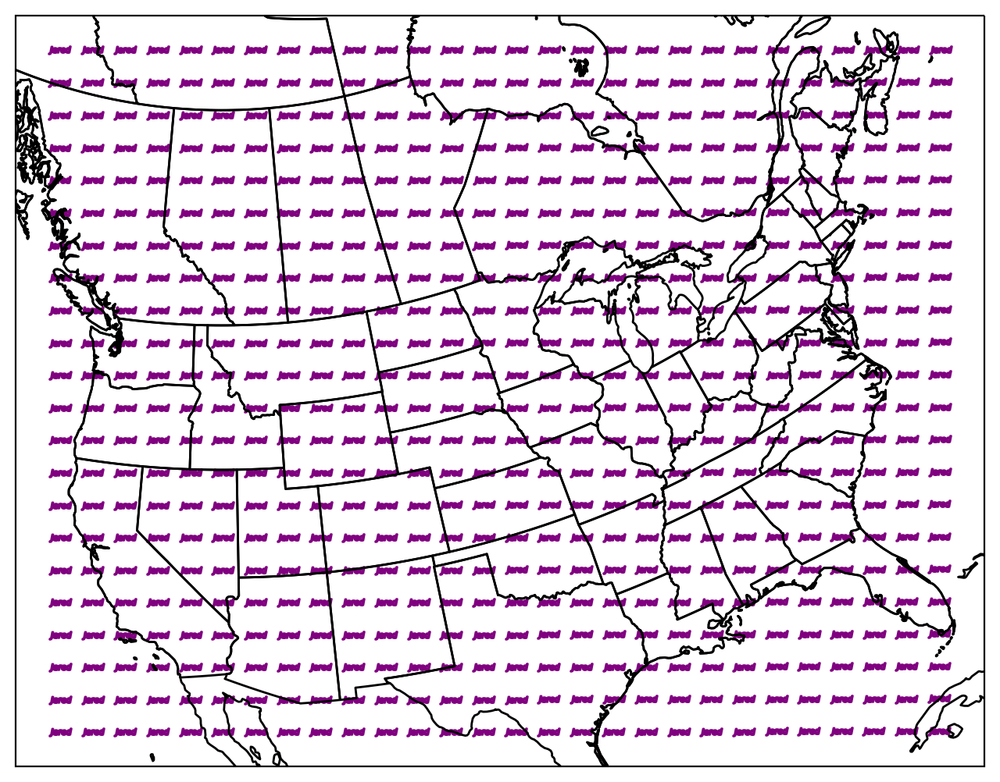

In [244]:
### Set up analysis map with a 22x28 rectangular grid of points ###
x_step = x_not + np.arange(22)*delta_x
y_step = y_not + np.arange(28)*delta_y
x_points, y_points = np.meshgrid(x_step, y_step)

### Convert x and y points to lat and lon for grid points ###
lon_grid = np.arctan(y_points/x_points)*(180/np.pi)+lambda_0
lat_grid = (180/np.pi)*((np.pi/2)-(2*np.arctan(np.sqrt((x_points/map_scale)**2+(y_points/map_scale)**2)/(rho*(1+np.sin(phi_0))))))

proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(8,8),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

ax1.scatter(lon_grid.ravel(),lat_grid.ravel(),c='purple',marker='$Jared$',s=100,transform=ccrs.PlateCarree())

In [245]:
### convert obs lat/long to x,y ###
sigma = (1+np.sin(phi_0))/(1+np.sin((lats*(np.pi/180))))
r = rho*sigma*np.cos(lats*((np.pi/180)))*map_scale
x_obs = r*np.cos(((lons*(np.pi/180))-(lambda_0*(np.pi/180))))
y_obs = r*np.sin((lons*(np.pi/180))-lambda_0*(np.pi/180))

In [246]:
### Calculate dmin and multiply by each of the RoIs ###
dmin = calc_dmin(x_obs.values, y_obs.values)
rois = np.array([4, 2.5, 1.5]) * dmin

In [247]:
### Declare empty arrays for analysis values ###
analysis_array = np.empty((y_n, x_n, len(rois)))
background_obs = np.empty((len(hgts_500), len(rois)))

In [248]:
### First analysis, no successive corrections ###
for i in range(len(x_points)):
    for j in range(len(x_points[0])):
        rel_x = x_points[i, j] - x_obs
        rel_y = y_points[i, j] - y_obs
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[0])[0]
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        f_o = hgts_500[ind_rois].values
            
        analysis_array[i, j, 0] = cressman(0, rois[0], x_k, y_k, f_o)

In [249]:
### Calculate background 1 and successive correction pass 1 ###
background_obs[:,0] = find_background_obs(rois[0], 0)
for i in range(len(x_points)):
    for j in range(len(x_points[0])):
        rel_x = x_points[i, j] - x_obs
        rel_y = y_points[i, j] - y_obs
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[1])[0]
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        f_o = hgts_500[ind_rois].values
        
        back_a = analysis_array[i,j,0]
        back_o = background_obs[ind_rois, 0]
        analysis_array[i, j, 1] = cressman(1, rois[1], x_k, y_k, f_o, background_a = back_a, back_o = back_o)

In [250]:
### Calculate background pass 2 and successive correction pass 2 ###
background_obs[:,1] = find_background_obs(rois[1], 1)
for i in range(len(x_points)):
    for j in range(len(x_points[0])):
        rel_x = x_points[i, j] - x_obs
        rel_y = y_points[i, j] - y_obs
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<=rois[2])[0]
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        f_o = hgts_500[ind_rois].values
        
        back_a = analysis_array[i,j,1]
        back_o = background_obs[ind_rois, 1]
        analysis_array[i, j, 2] = cressman(2, rois[2], x_k, y_k, f_o, background_a = back_a, back_o = back_o)

/var/folders/06/psvnwwys3wb8jvz_dtrft5080000gn/T/ipykernel_2138/298766877.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cress_a = background_a + (np.nansum(weights*(f_o-back_o))/np.nansum(weights))
/var/folders/06/psvnwwys3wb8jvz_dtrft5080000gn/T/ipykernel_2138/298766877.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cress_a = background_a + (np.nansum(weights*(f_o-back_o))/np.nansum(weights))
/var/folders/06/psvnwwys3wb8jvz_dtrft5080000gn/T/ipykernel_2138/298766877.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cress_a = background_a + (np.nansum(weights*(f_o-back_o))/np.nansum(weights))
/var/folders/06/psvnwwys3wb8jvz_dtrft5080000gn/T/ipykernel_2138/298766877.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cress_a = background_a + (np.nansum(weights*(f_o-back_o))/np.nansum(weights))
/var/folders/06/psvnwwys3wb8jvz_dtrft5080000gn/T/ipykernel_2138/298766877.py:20: RuntimeWarning: invalid value encou

In [251]:
### Calculate Analysis Differences ###
diff_2_1 = analysis_array[:,:,1] - analysis_array[:,:,0]
diff_3_1 = analysis_array[:,:,2] - analysis_array[:,:,0]
diff_3_2 = analysis_array[:,:,2] - analysis_array[:,:,1]

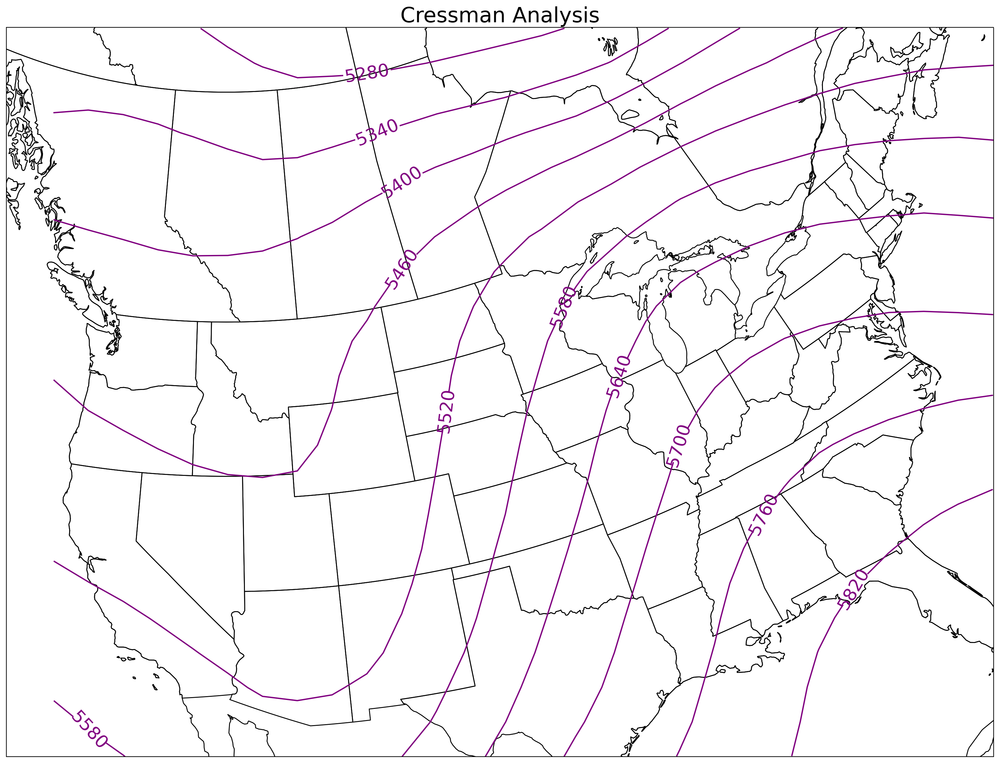

In [252]:
### Perform 500mb geopotential height analyses using a Cressman weighting Function ###
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(lon_grid, lat_grid, analysis_array[:,:,0], colors = 'purple', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('Cressman Analysis')
plt.show()

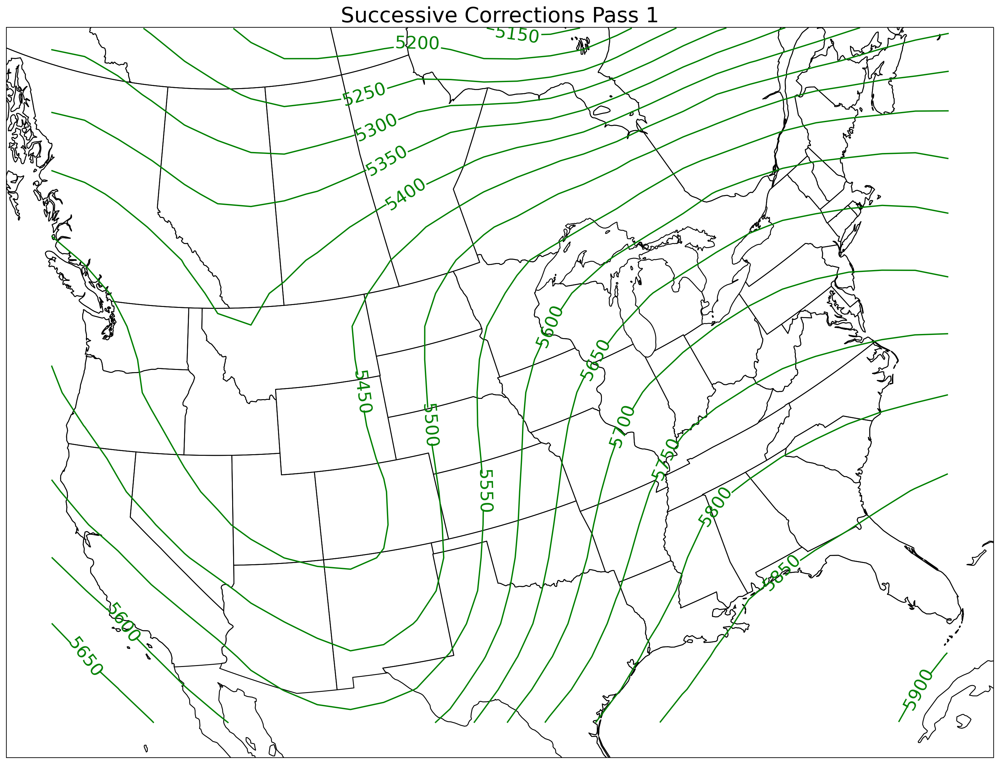

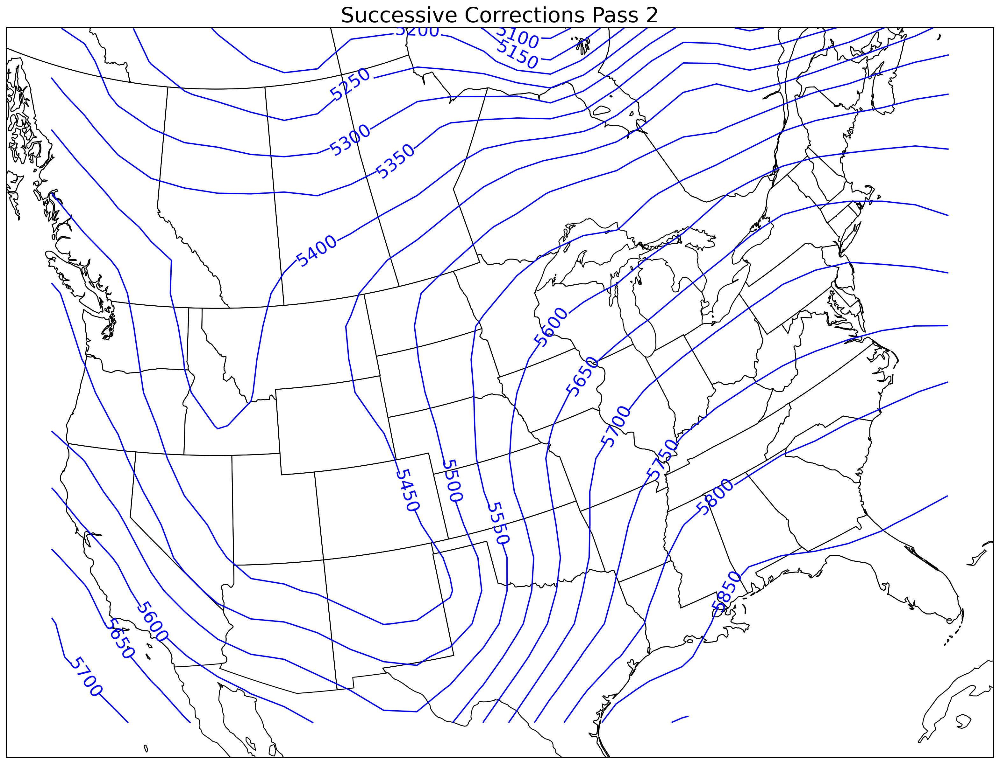

In [253]:
### Next Analyses ###
### Plot first pass of successive corrections ###
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotpass1 = ax1.contour(lon_grid,lat_grid,analysis_array[:,:,1],colors='green',levels=np.arange(0,8000,50),transform=ccrs.PlateCarree())
plt.clabel(plotpass1,levels=np.arange(0,8000,50))
plt.title('Successive Corrections Pass 1')
plt.savefig('Successive Corrections Pass 1')
plt.show()

### Plot second pass of successive corrections ###
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotpass2 = ax1.contour(lon_grid,lat_grid,analysis_array[:,:,2],colors='blue',levels=np.arange(0,8000,50),transform=ccrs.PlateCarree())
plt.clabel(plotpass2,levels=np.arange(0,8000,50))
plt.title('Successive Corrections Pass 2')
plt.savefig('Successive Corrections Pass 2')
plt.show()

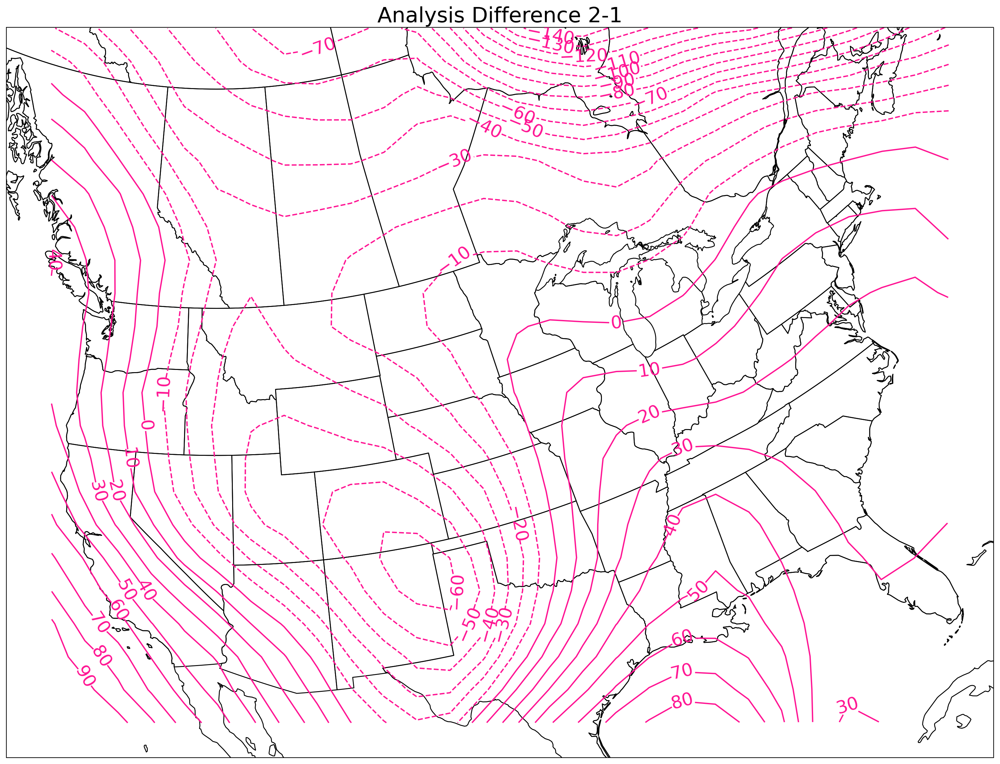

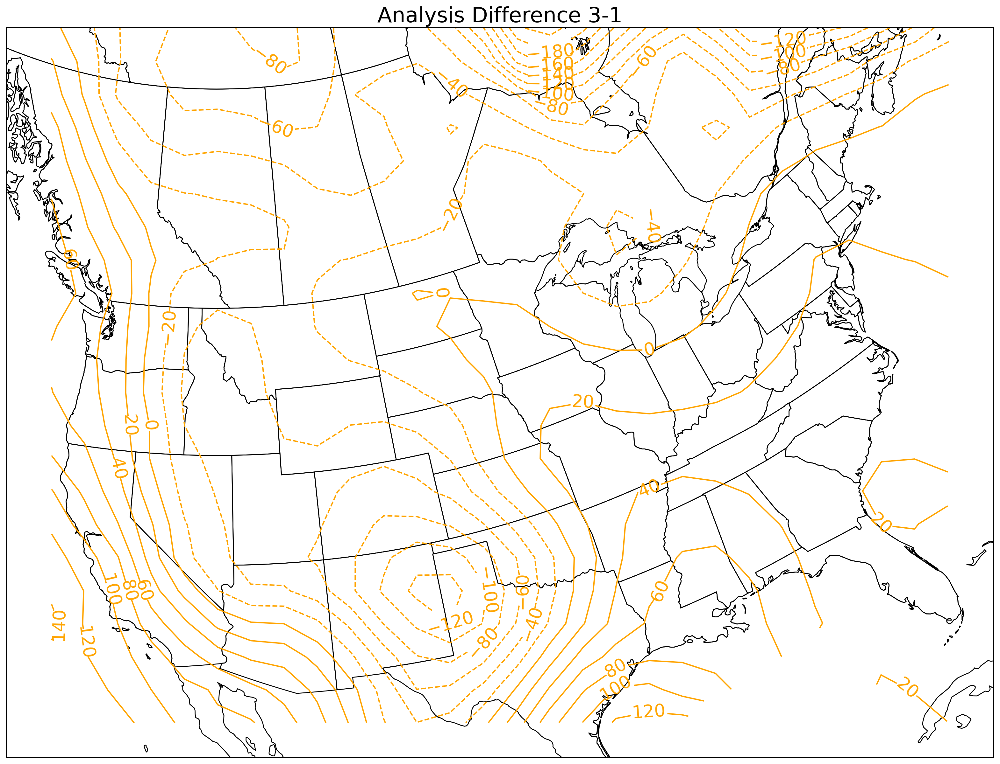

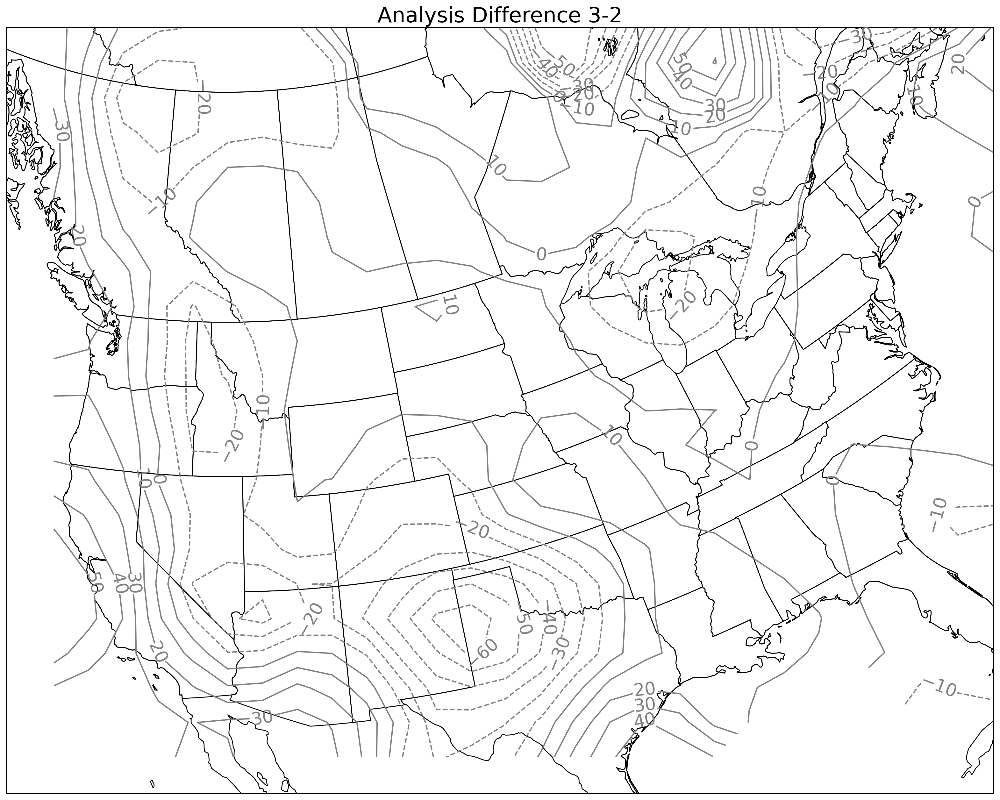

In [259]:
### Plot Analysis Differences ###
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotdiff1 = ax1.contour(lon_grid,lat_grid,diff_2_1,colors='deeppink',levels=np.arange(-8000,8000,10),transform=ccrs.PlateCarree())
plt.clabel(plotdiff1,levels=np.arange(-8000,8000,10))
plt.title('Analysis Difference 2-1')
plt.savefig('Analysis Difference 2-1')
plt.show()

proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotdiff1 = ax1.contour(lon_grid,lat_grid,diff_3_1,colors='orange',levels=np.arange(-8000,8000,20),transform=ccrs.PlateCarree())
plt.clabel(plotdiff1,levels=np.arange(-8000,8000,20))
plt.title('Analysis Difference 3-1')
plt.savefig('Analysis Difference 3-1')
plt.show()

proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotdiff1 = ax1.contour(lon_grid,lat_grid,diff_3_2,colors='grey',levels=np.arange(-8000,8000,10),transform=ccrs.PlateCarree())
plt.clabel(plotdiff1,levels=np.arange(-8000,8000,10))
plt.title('Analysis Difference 3-2')
plt.savefig('Analysis Difference 3-2')
plt.show()

In [255]:
### Perform RMS differences ###
background_obs1=(background_obs[:,0])
background_obs2=(background_obs[:,1])
background_obs3=(background_obs[:,2])

#Pass1
rms_top_1 = (hgts_500 - background_obs1)**2
rms_top_1 = rms_top_1[~np.isnan(rms_top_1)]
rms_1 = np.sqrt((np.sum(rms_top_1))/ len(rms_top_1))

#Pass2
rms_top_2 = (hgts_500 - background_obs2)**2
rms_top_2 = rms_top_2[~np.isnan(rms_top_2)]
rms_2 = np.sqrt((np.sum(rms_top_2))/ len(rms_top_2))

#Pass3
rms_top_3 = (hgts_500 - background_obs3)**2
rms_top_3 = rms_top_3[~np.isnan(rms_top_3)]
rms_3 = np.sqrt((np.sum(rms_top_3))/ len(rms_top_3))

rms_array=[rms_1,rms_2,rms_3]
rms_array

[74.54329800402623, 35.12766126581695, 5515.418326597947]

In [256]:
### Store the analyses in text files ###
analysis_cressman_file=open("HW2_Nielsen_Cressman_analysis.txt","w+")
analysis_1=str(analysis_array[:,:,0])
analysis_cressman_file.write(analysis_1)
analysis_cressman_file.close()

analysis_successive_file1=open("HW2_Nielsen_Successive_pass_1.txt","w+")
analysis_2=str(analysis_array[:,:,1])
analysis_successive_file1.write(analysis_2)
analysis_successive_file1.close()

analysis_successive_file2=open("HW2_Nielsen_Successive_pass_2.txt","w+")
analysis_3=str(analysis_array[:,:,2])
analysis_successive_file2.write(analysis_3)
analysis_successive_file2.close

<function TextIOWrapper.close()>

In [257]:
### Store the difference fields in text files ###
diff_file_2_1=open("HW2_Nielsen_difference_2_1.txt","w+")
diff_1=str(diff_2_1)
diff_file_2_1.write(diff_1)
diff_file_2_1.close()

diff_file_3_1=open("HW2_Nielsen_difference_3_1.txt","w+")
diff_2=str(diff_3_1)
diff_file_3_1.write(diff_2)
diff_file_3_1.close()

diff_file_3_2=open("HW2_Nielsen_difference_3_2.txt","w+")
diff_3=str(diff_3_2)
diff_file_3_2.write(diff_3)
diff_file_3_2.close()

In [258]:
### Store RMS values in text file ###
rms_file=open("HW2_Nielsen_rms.txt","w+")
rms=str(rms_array)
rms_file.write(rms)
rms_file.close()

In [ ]:
### In a separte text file (or below), answer the following questions ###
'''
1 - Describe the general features that you see in your contoured analyses.
    
    The general features seen in the contoured analyses are a trough and a ridge. The ridge is located
    over the Eastern United States and the trough is located over the Western United States. On the
    second pass of successive corrections, the features are more well defined. The trough becomes deeper
    and the ridge starts to lean back towards the west.

2 - Describe the differences that you see in your contoured analyses.  
    Does one analysis seem to be smoother than the other?  If so, what would cause this?
    
    The differences between the analyses have to do with the number of contours and the smoothness of 
    the contours. The Cressman weighted analysis has smooth contours, but not a lot of contours in 
    total. The first pass of successive corrections was more detailed with the contours, but wasn't as 
    smooth as the Cressman weighted analysis. The second pass of successive corrections was the least
    smooth of the passes, but it also showed the most detail of the passes. It was able to show smaller
    scale features that the other passes were unable to resolve.

3 - What happens as you increase the number of successive correction passes?  Is this 
    desirable?  Why or why not?
    
    As you increase the number of successive correction passes, you are able to better resolve smaller 
    scale features. As you do this, the contours become less smooth, and you can even lose some of the 
    larger features of the flow if you do enough passes, similar to what we saw in class. This is
    somewhat desirable. We want to be able to resolve some of the finer details of the flow, but we don't 
    want a jumbled mess of contours that makes analysis impossible.

'''